In [2]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split



In [3]:
data_dir = '../../dataset/cropped_coins'
image_size = (224, 224)  # Resize images to fit MobileNetV2 input size (224x224)

# Initialize lists for images and labels
images = []
labels = []

# Loop through each folder (representing each label) in the dataset directory
for folder_name in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder_name)

    # Check if it is a folder (not a file)
    if os.path.isdir(folder_path):
        label = folder_name  # Folder name is the label (e.g., '1 euro', '2 euro', etc.)
        for filename in os.listdir(folder_path):
            # Check if the file is an image (.jpg or .jpeg)
            if filename.endswith('.jpg') or filename.endswith('.jpeg'):
                img_path = os.path.join(folder_path, filename)

                # Load and resize the image
                img = image.load_img(img_path, target_size=image_size)

                # Convert the image to a numpy array
                img_array = image.img_to_array(img)

                # Append the image and its corresponding label
                images.append(img_array)
                labels.append(label)

# Convert images and labels to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Encode labels as integers (e.g., '1 euro' -> 0, '2 euro' -> 1, ...)
label_dict = {label: idx for idx, label in enumerate(sorted(set(labels)))}
labels = np.array([label_dict[label] for label in labels])

# One-hot encode labels (e.g., [1, 0, 0] for '1 euro', [0, 1, 0] for '2 euro', etc.)
labels = to_categorical(labels, num_classes=len(label_dict))

# Normalize the images (scale pixel values to [0, 1])
images = images / 255.0

# Split data into training and validation sets (80% train, 20% validation)
X_train, X_val, y_train, y_val = train_test_split(images, labels, test_size=0.2, random_state=42)

# Check the shape of the data
print("Training data shape:", X_train.shape)
print("Validation data shape:", X_val.shape)

Training data shape: (1188, 224, 224, 3)
Validation data shape: (297, 224, 224, 3)


In [4]:
print(labels)
print(label_dict)

[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
{'0.01': 0, '0.02': 1, '0.05': 2, '0.10': 3, '0.20': 4, '0.50': 5, '1': 6, '2': 7}


In [5]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(8, activation='softmax'))

model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

C:\Users\mouha\AppData\Roaming\Python\Python310\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [6]:
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

Epoch 1/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 58s 999ms/step - accuracy: 0.1585 - loss: 3.6687 - val_accuracy: 0.2256 - val_loss: 1.9453
Epoch 2/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step - accuracy: 0.2799 - loss: 1.8867 - val_accuracy: 0.4175 - val_loss: 1.5782
Epoch 3/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 37s 924ms/step - accuracy: 0.4211 - loss: 1.5134 - val_accuracy: 0.4646 - val_loss: 1.3688
Epoch 4/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 36s 937ms/step - accuracy: 0.5750 - loss: 1.1485 - val_accuracy: 0.5185 - val_loss: 1.2712
Epoch 5/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 37s 971ms/step - accuracy: 0.6375 - loss: 0.9677 - val_accuracy: 0.5589 - val_loss: 1.1404
Epoch 6/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.6831 - loss: 0.8332 - val_accuracy: 0.5657 - val_loss: 1.1971
Epoch 7/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 33s 868ms/step - accuracy: 0.7373 - loss: 0.6822 - val_accuracy: 0.5320 - val_loss: 1.2593
Epoch 8/10
38/38 ━━━━━━━━━━━━━━━━━━━━ 96s 3s/step - accuracy: 0.7914 - loss: 0.5309 - val_accuracy: 0.4

: 

In [ ]:
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}")
print(f"Validation Accuracy: {val_accuracy}")

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
y_pred=model.predict(X_val)
y_pred_classes=np.argmax(y_pred,axis=1)
y_true=np.argmax(y_val,axis=1)
cm=confusion_matrix(y_pred_classes,y_true)
print(cm)
class_labels = ['0.01', '0.02', '0.05', '0.10', '0.20', '0.50', '1', '2']

import seaborn as sns
sns.heatmap(cm, annot=True, cmap='Blues',xticklabels=class_labels, yticklabels=class_labels)
# Display the plot
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

38/38 ━━━━━━━━━━━━━━━━━━━━ 8s 218ms/step
[[128   2   3   0   0   0   0   0]
 [  2 145   9   1   0   0   0   0]
 [  0   0 155   0   0   0   0   0]
 [  0   3   0 184   4   1   0   0]
 [  0   1   0   2 151   1   0   0]
 [  0   0   0   2   1 120   0   0]
 [  0   0   0   0   0   0 151   0]
 [  1   1   2   1   1   0   0 116]]


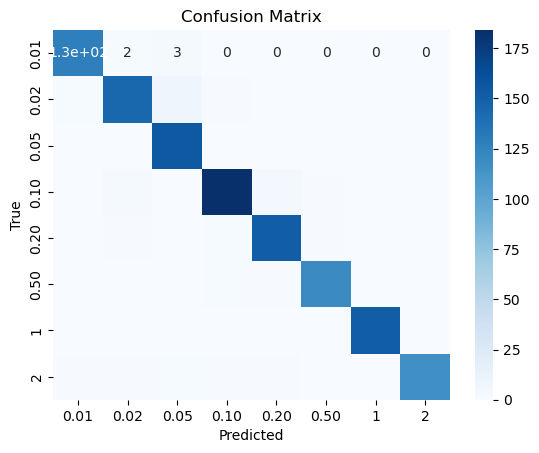

In [17]:
y_pred=model.predict(X_train)
y_pred_classes=np.argmax(y_pred,axis=1)
y_true=np.argmax(y_train,axis=1)
cm=confusion_matrix(y_pred_classes,y_true)
print(cm)
class_labels = ['0.01', '0.02', '0.05', '0.10', '0.20', '0.50', '1', '2']


sns.heatmap(cm, annot=True, cmap='Blues',xticklabels=class_labels, yticklabels=class_labels)
# Display the plot
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [18]:
from sklearn.metrics import f1_score, accuracy_score
accuracy=accuracy_score(y_true,y_pred_classes)
f1_score_weighted=f1_score(y_true,y_pred_classes,average='weighted')
f1_score_macro=f1_score(y_true,y_pred_classes,average='macro')
print(f"the accuracy score is : {accuracy}")
print(f"the weighted F1 score is : {f1_score_weighted}")

print(f"the macro F1 score is {f1_score_macro}")

the accuracy score is : 0.968013468013468
the weighted F1 score is : 0.9679898887573152
the macro F1 score is 0.9688349595005893


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


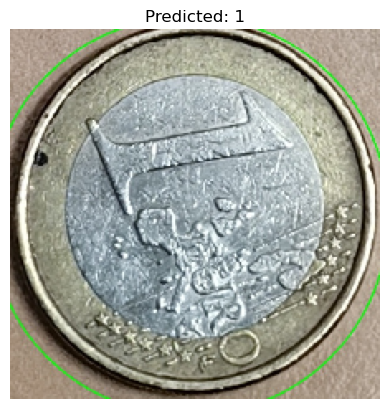

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


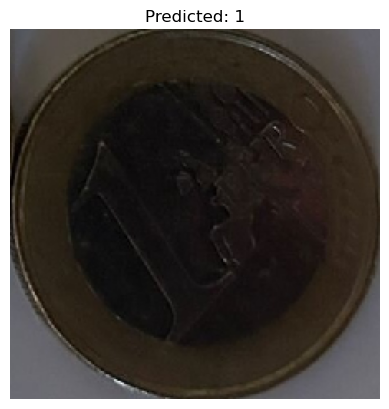

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step


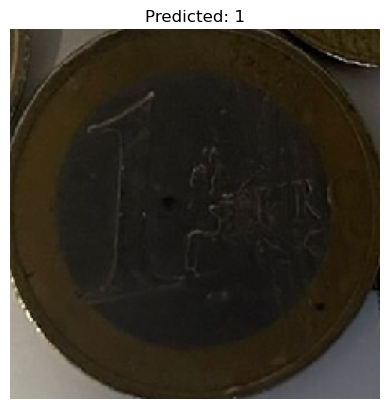

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


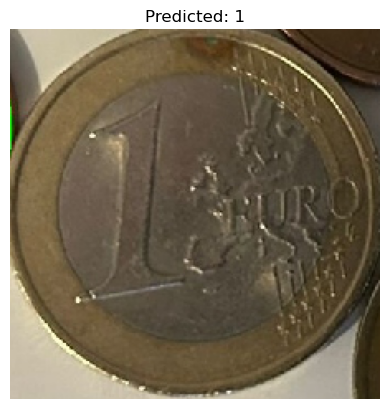

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


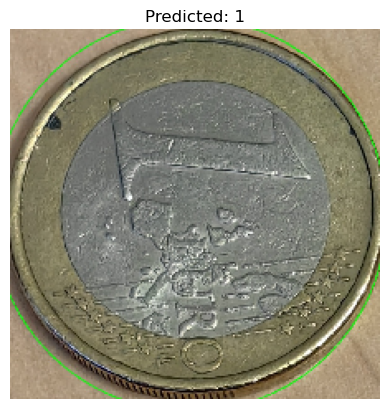

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


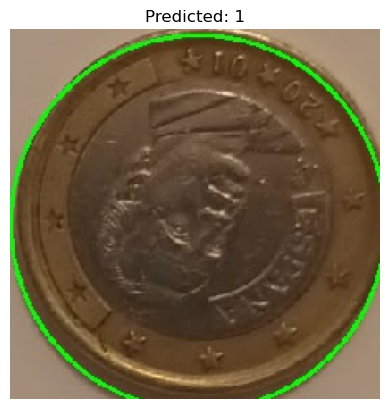

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step


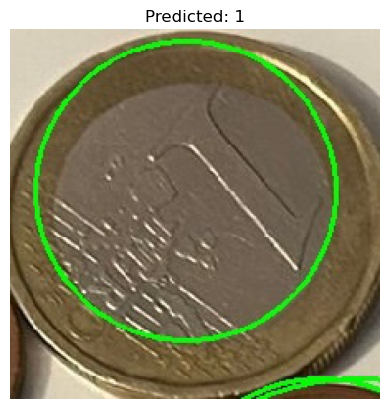

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


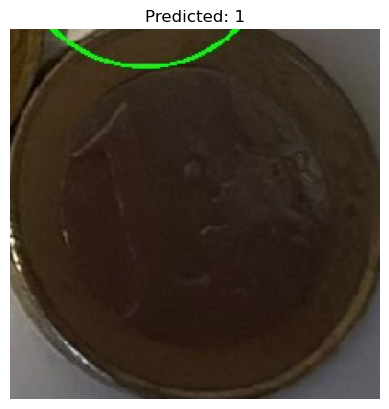

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step


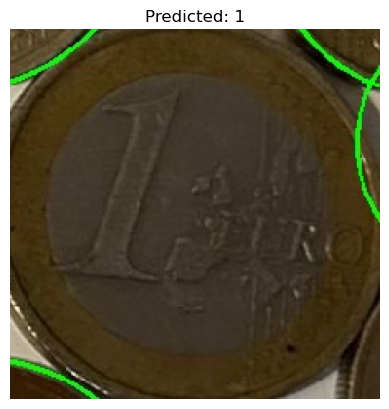

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


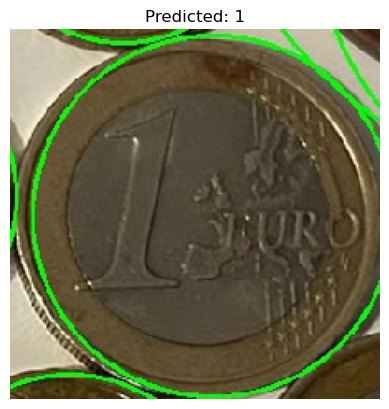

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


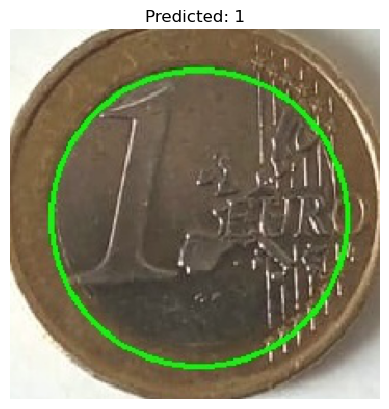

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


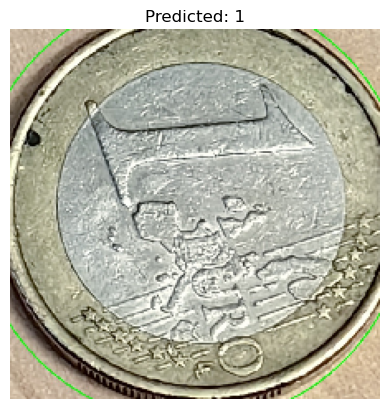

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


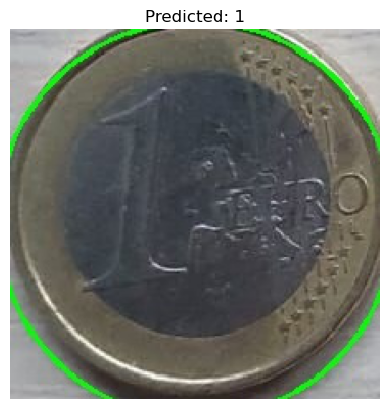

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


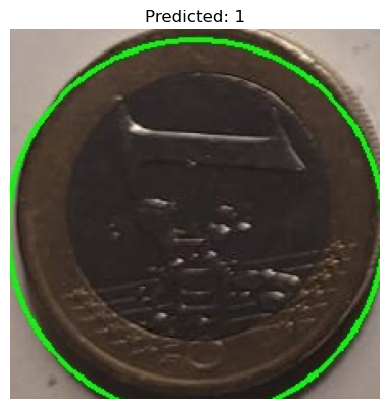

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


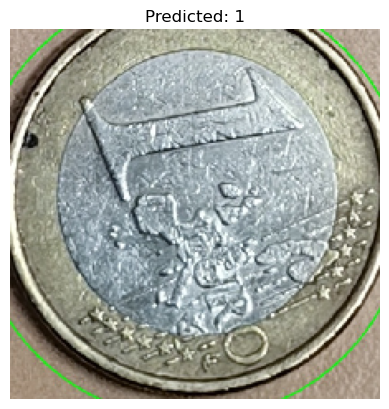

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


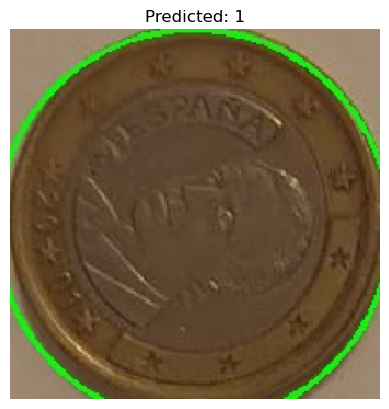

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


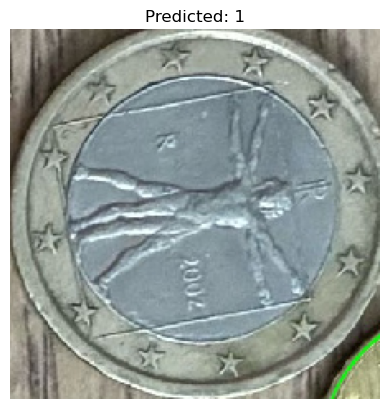

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


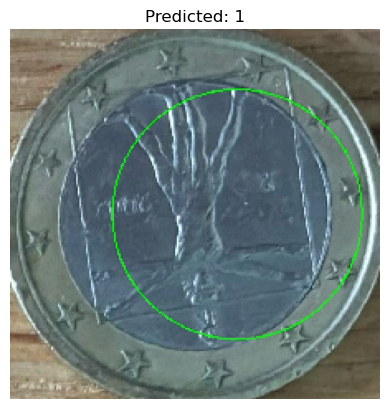

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


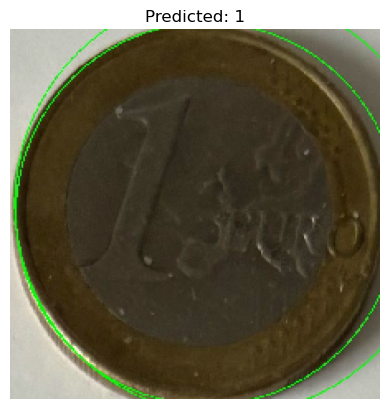

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


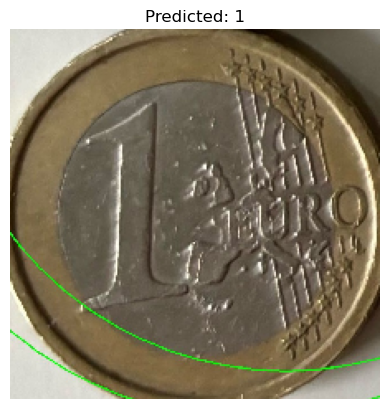

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


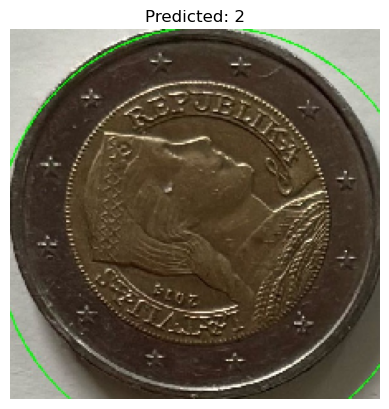

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step


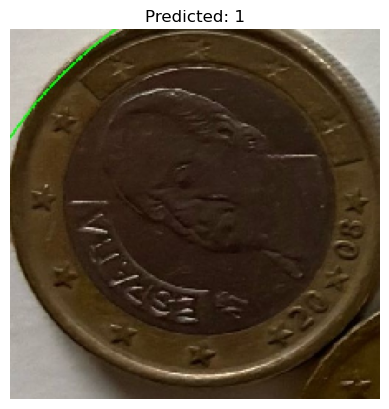

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


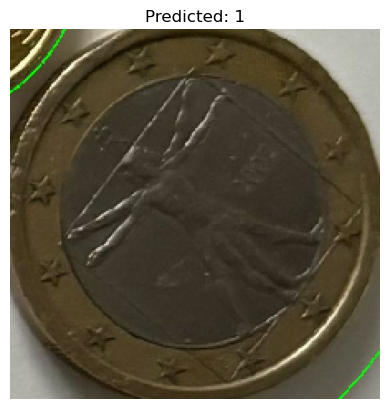

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


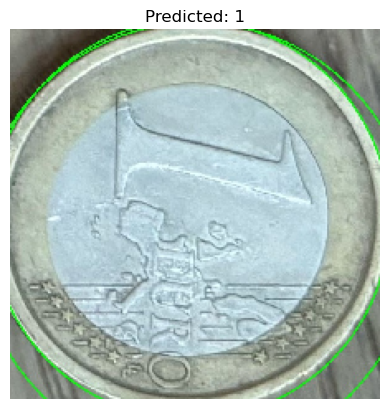

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


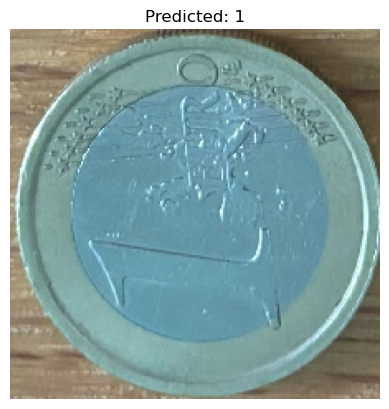

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


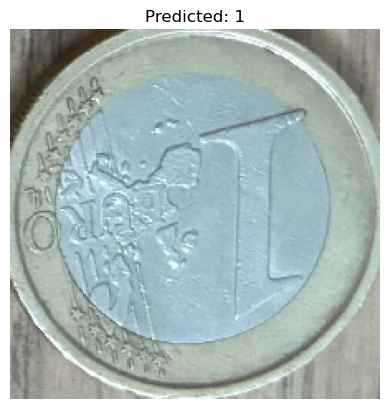

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


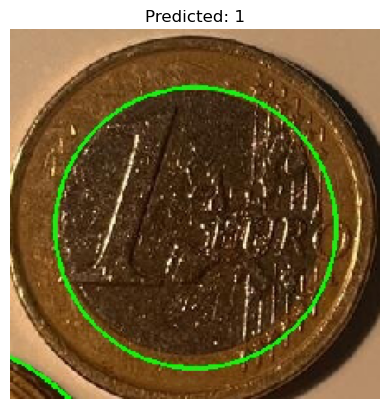

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


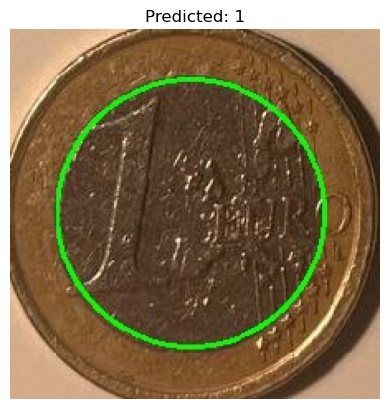

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


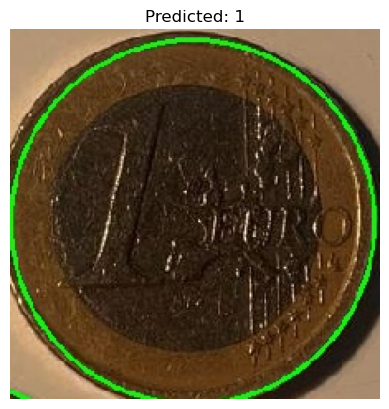

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


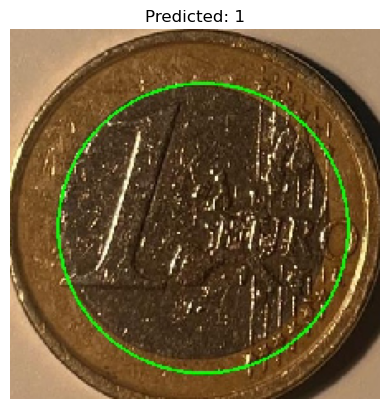

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


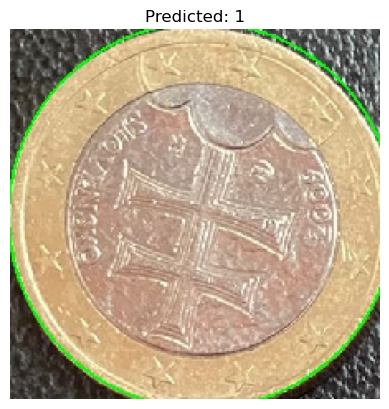

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


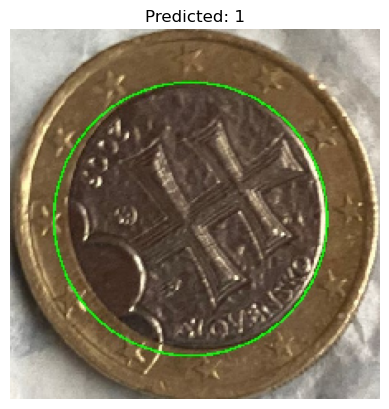

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


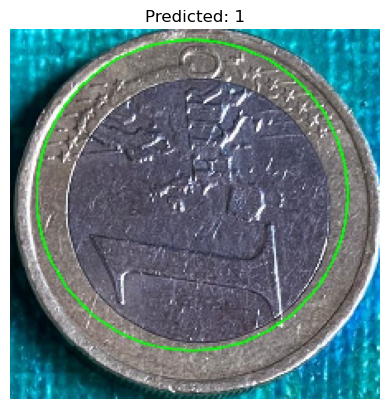

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


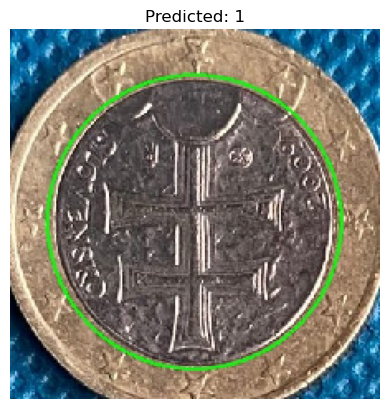

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


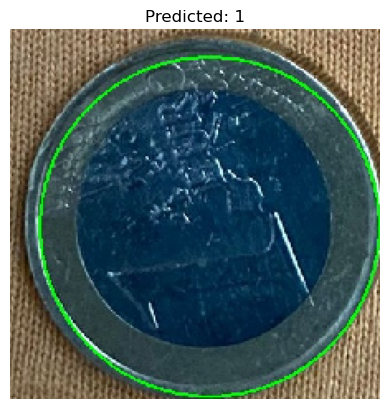

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


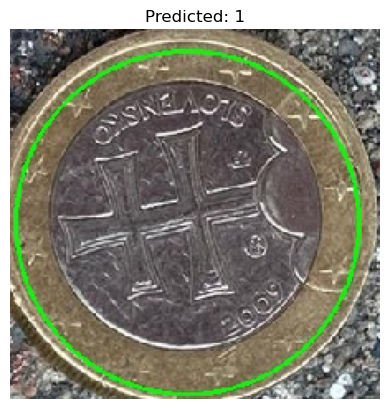

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


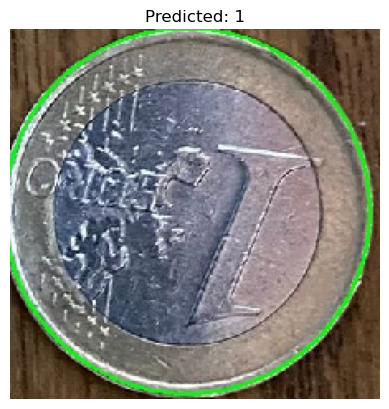

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


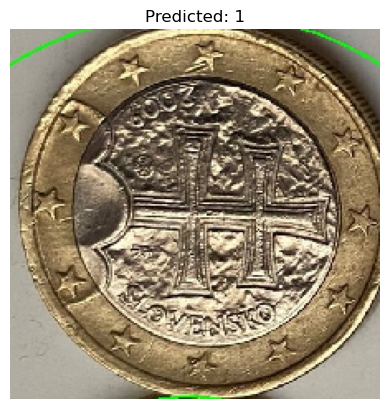

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


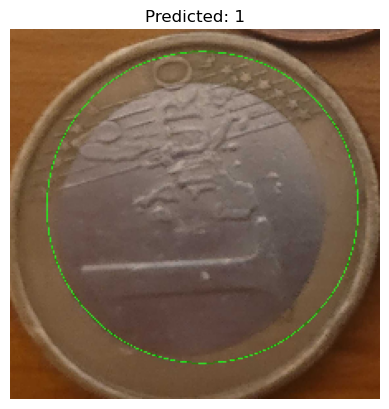

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


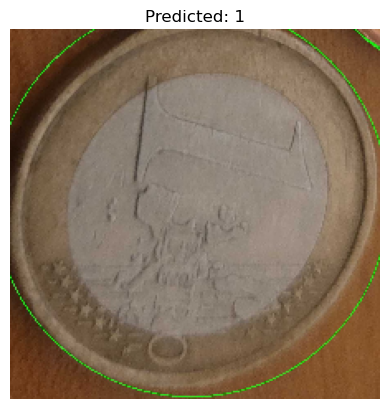

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


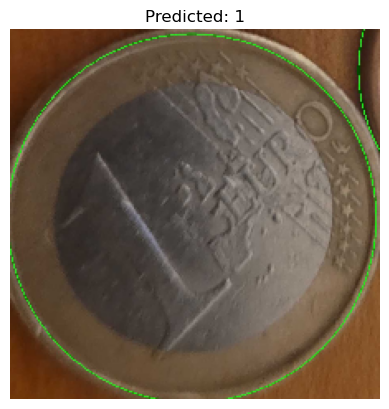

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


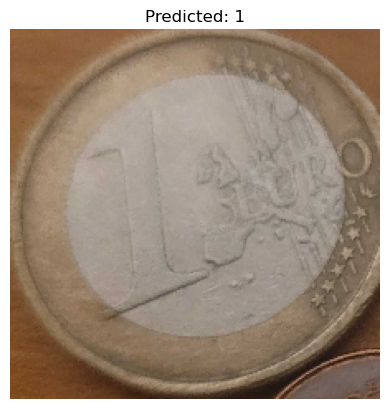

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step


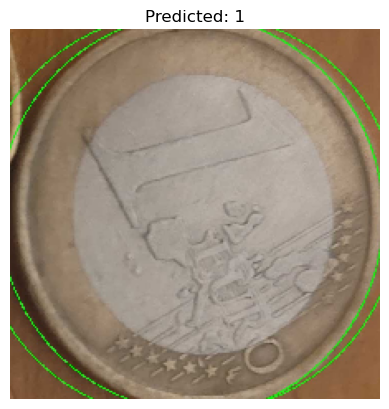

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


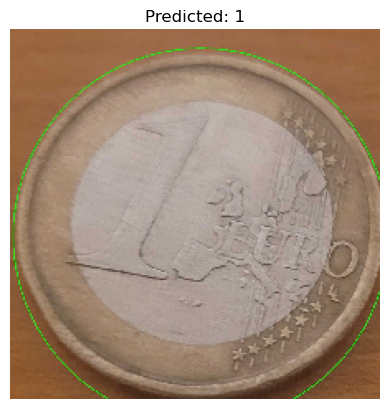

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


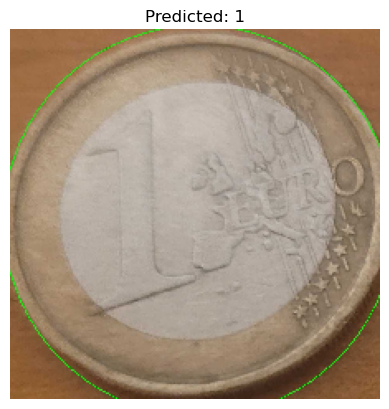

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


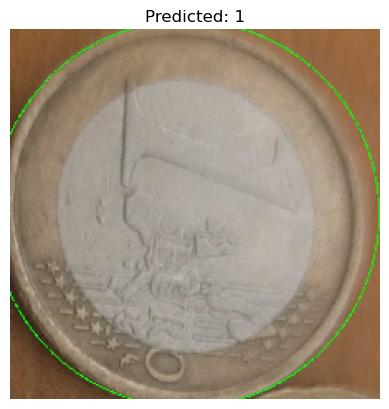

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


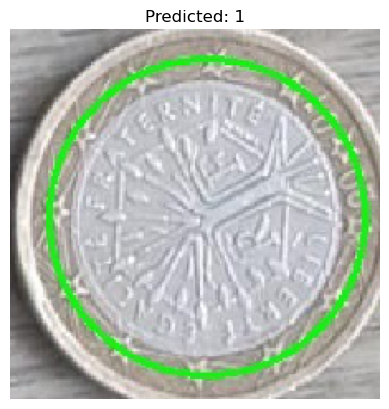

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


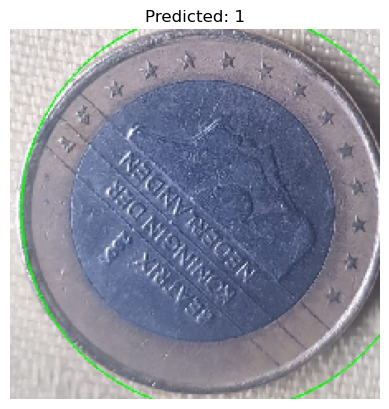

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


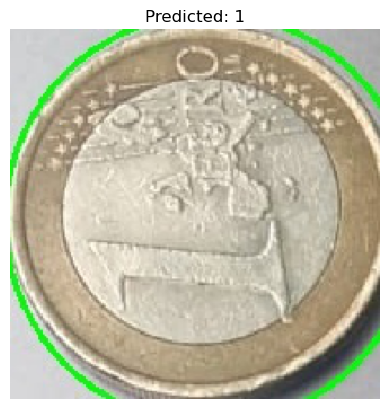

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step


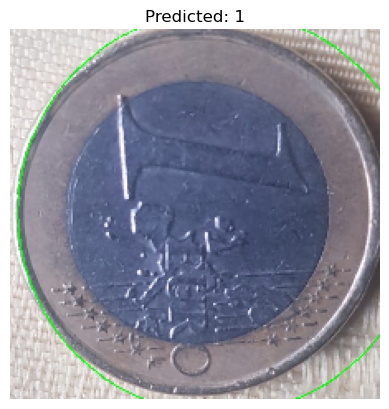

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


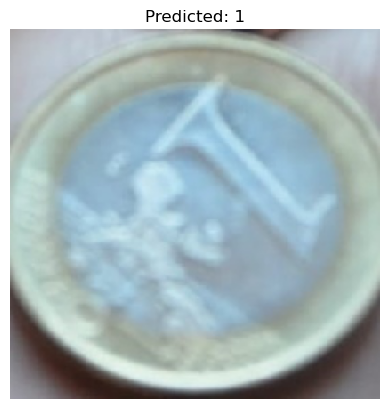

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


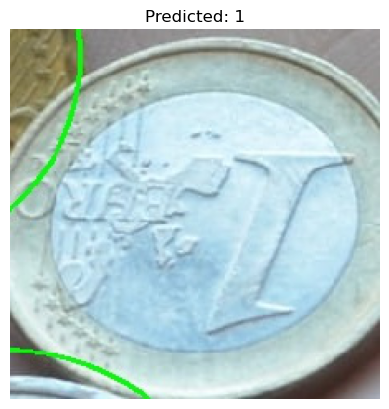

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


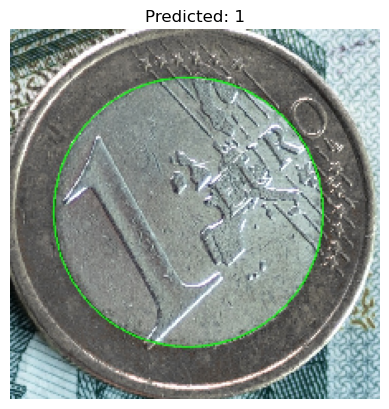

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step


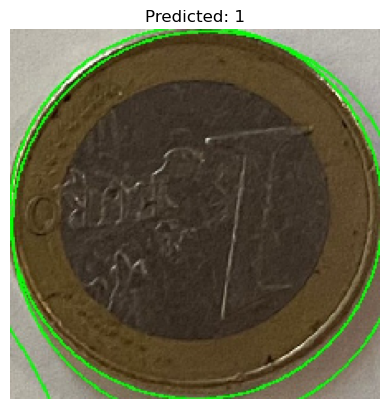

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


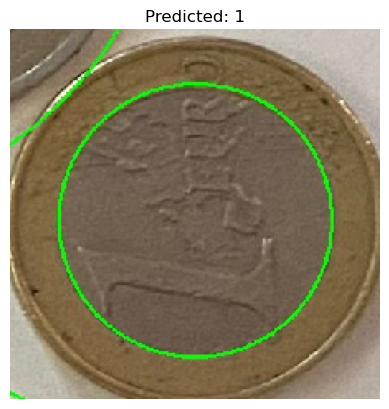

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


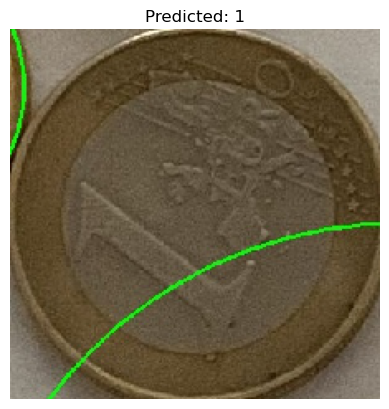

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step


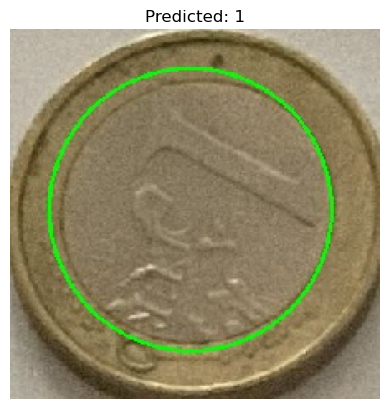

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step


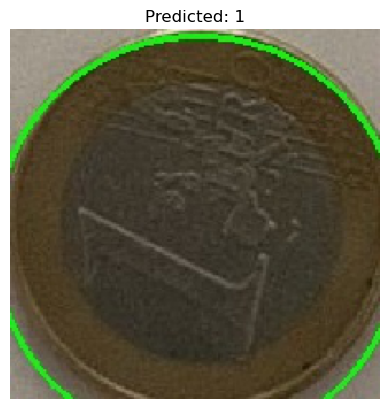

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


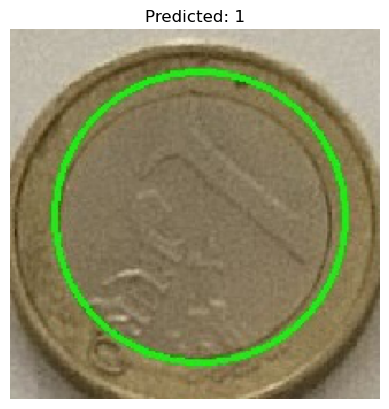

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


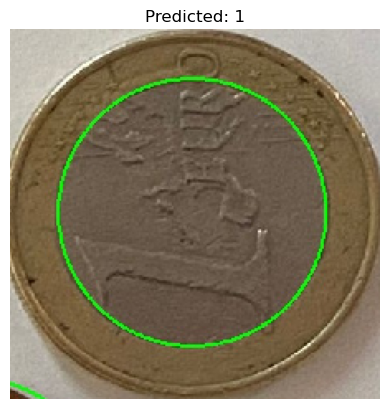

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


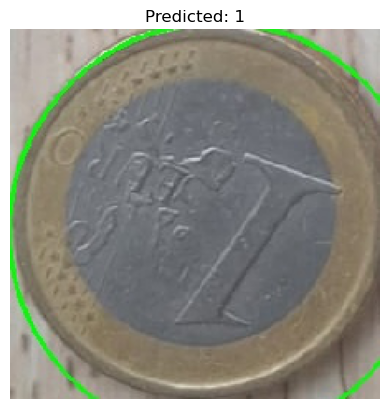

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


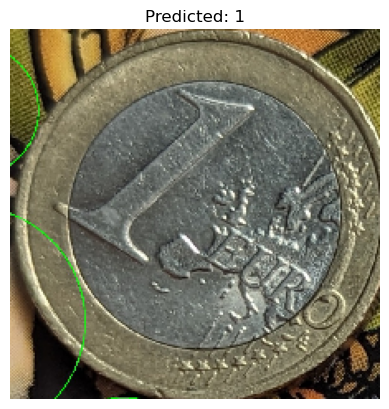

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


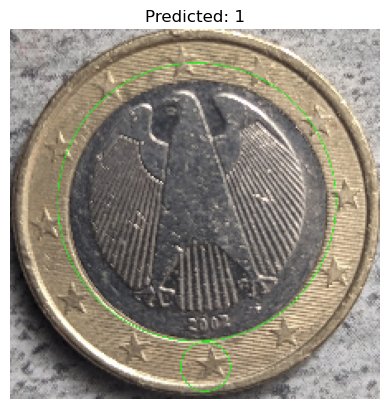

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


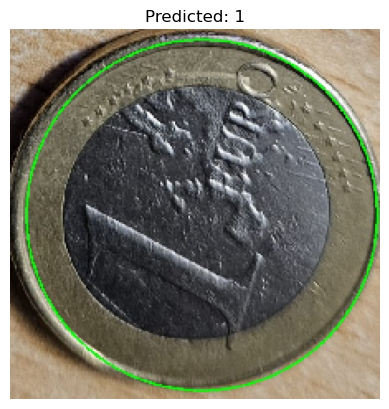

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


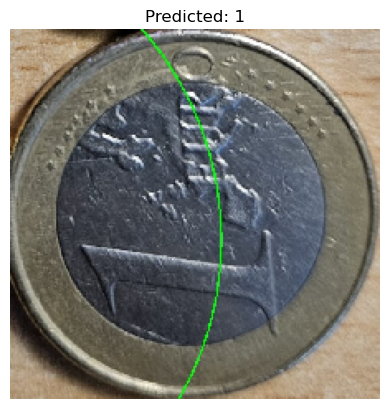

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step


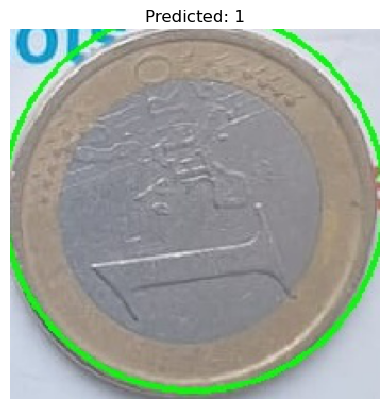

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


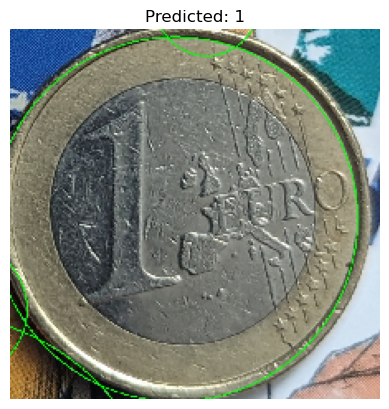

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


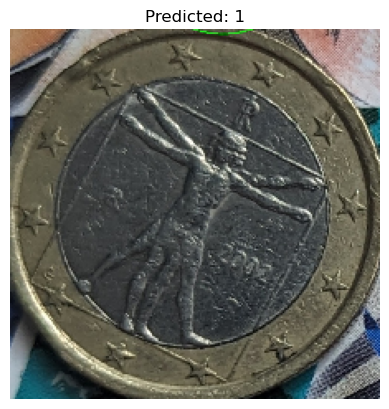

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


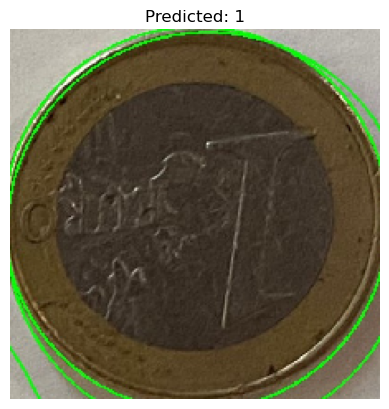

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


In [ ]:
import matplotlib.pyplot as plt

# Path to the directory containing all the fox images
fox_directory = os.path.join(data_dir, '1')

# Initialize list for storing results
image_names = []
predicted_labels = []

# Loop through each image in the 'fox' directory
for filename in os.listdir(fox_directory):
    # Check if the file is an image (.jpg or .jpeg)
    if filename.endswith('.jpg') or filename.endswith('.jpeg'):
        img_path = os.path.join(fox_directory, filename)

        # Load and preprocess the image
        img = image.load_img(img_path, target_size=(224, 224))  # Resize to match the model input size
        img_array = image.img_to_array(img)  # Convert to numpy array
        img_array = img_array / 255.0  # Normalize the image (same as during training)

        # Add a batch dimension (model expects a batch of images)
        img_array = np.expand_dims(img_array, axis=0)

        # Make a prediction
        prediction = model.predict(img_array)

        # Get the predicted class (index of the highest probability)
        predicted_class = np.argmax(prediction, axis=1)

        # Map predicted class index to class label
        reverse_label_dict = {v: k for k, v in label_dict.items()}
        predicted_label = reverse_label_dict[predicted_class[0]]

        # Store the result
        image_names.append(filename)
        predicted_labels.append(predicted_label)

        # Optionally, display the image and its prediction
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Predicted: {predicted_label}")
        plt.show()

# Print the results
for img_name, label in zip(image_names, predicted_labels):
    print(f"Image: {img_name}, Predicted Label: {label}")
